In [2]:
import tensorflow as tf
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from pathlib import Path
from keras.models import model_from_json

# testing on the real pollution data WORK


## preprocessing

In [ ]:
# import pandas as pd
# import numpy as np
# import glob
# import os

# # Define the sub-index calculation function based on CPCB guidelines
# def calculate_sub_index(concentration, pollutant):
#     if pollutant == "PM2.5":
#         if concentration <= 30:
#             return concentration * 50 / 30
#         elif concentration <= 60:
#             return 50 + (concentration - 30) * 50 / 30
#         elif concentration <= 90:
#             return 100 + (concentration - 60) * 100 / 30
#         elif concentration <= 120:
#             return 200 + (concentration - 90) * 100 / 30
#         elif concentration <= 250:
#             return 300 + (concentration - 120) * 100 / 130
#         else:
#             return 400 + (concentration - 250) * 100 / 130
#     elif pollutant == "PM10":
#         if concentration <= 50:
#             return concentration
#         elif concentration <= 100:
#             return 50 + (concentration - 50)
#         elif concentration <= 250:
#             return 100 + (concentration - 100) * 100 / 150
#         elif concentration <= 350:
#             return 200 + (concentration - 250)
#         elif concentration <= 430:
#             return 300 + (concentration - 350) * 100 / 80
#         else:
#             return 400 + (concentration - 430) * 100 / 80
#     elif pollutant == "SO2" or pollutant == "NO2":
#         if concentration <= 40:
#             return concentration * 50 / 40
#         elif concentration <= 80:
#             return 50 + (concentration - 40) * 50 / 40
#         elif concentration <= 380:
#             return 100 + (concentration - 80) * 100 / 300
#         elif concentration <= 800:
#             return 200 + (concentration - 380) * 100 / 420
#         elif concentration <= 1600:
#             return 300 + (concentration - 800) * 100 / 800
#         else:
#             return 400 + (concentration - 1600) * 100 / 800
#     elif pollutant == "CO":
#         if concentration <= 1:
#             return concentration * 50 / 1
#         elif concentration <= 2:
#             return 50 + (concentration - 1) * 50 / 1
#         elif concentration <= 10:
#             return 100 + (concentration - 2) * 100 / 8
#         elif concentration <= 17:
#             return 200 + (concentration - 10) * 100 / 7
#         elif concentration <= 34:
#             return 300 + (concentration - 17) * 100 / 17
#         else:
#             return 400 + (concentration - 34) * 100 / 17
#     elif pollutant == "Ozone":
#         if concentration <= 50:
#             return concentration
#         elif concentration <= 100:
#             return 50 + (concentration - 50)
#         elif concentration <= 168:
#             return 100 + (concentration - 100) * 100 / 68
#         elif concentration <= 208:
#             return 200 + (concentration - 168) * 100 / 40
#         elif concentration <= 748:
#             return 300 + (concentration - 208) * 100 / 540
#         else:
#             return 400 + (concentration - 748) * 100 / 540
#     else:
#         return 0

# def calculate_aqi(row):
#     sub_indices = {
#         "PM2.5": calculate_sub_index(row["PM2.5 (µg/m³)"], "PM2.5"),
#         "PM10": calculate_sub_index(row["PM10 (µg/m³)"], "PM10"),
#         "SO2": calculate_sub_index(row["SO2 (µg/m³)"], "SO2"),
#         "NO2": calculate_sub_index(row["NO2 (µg/m³)"], "NO2"),
#         "CO": calculate_sub_index(row["CO (mg/m³)"], "CO"),
#         "Ozone": calculate_sub_index(row["Ozone (µg/m³)"], "Ozone"),
#     }
#     valid_sub_indices = [sub_index for sub_index in sub_indices.values() if sub_index > 0]
#     if len(valid_sub_indices) >= 3:
#         return max(valid_sub_indices)
#     else:
#         return np.nan

# # Specify the directory where your CSV files are stored
# directory_path = r"c:\Users\Admin\Downloads"

# csv_files = glob.glob(os.path.join(directory_path, "Raw_data_1Hr_*.csv"))
# print(f"Found CSV files: {csv_files}")

# dataframes = []

# for file in csv_files:
#     try:
#         # Read the CSV
#         df = pd.read_csv(file)

#         # Dynamically check for a timestamp column
#         timestamp_col = [col for col in df.columns if 'time' in col.lower()]
#         if timestamp_col:
#             df['timestamp'] = pd.to_datetime(df[timestamp_col[0]])
#         else:
#             print(f"Timestamp column missing in {file}. Using index as timestamp.")
#             df['timestamp'] = pd.to_datetime(df.index, errors='coerce')

#         # Sort values by timestamp
#         df.sort_values("timestamp", inplace=True)

#         # Handle missing pollutant data
#         pollutant_columns = ['PM2.5 (µg/m³)', 'PM10 (µg/m³)', 'SO2 (µg/m³)', 'NO2 (µg/m³)', 'CO (mg/m³)', 'Ozone (µg/m³)']
#         df[pollutant_columns] = df[pollutant_columns].fillna(method='ffill').fillna(method='bfill')

#         # Calculate AQI
#         df["AQI"] = df.apply(calculate_aqi, axis=1)

#         # Debugging rows where AQI is NaN but sufficient pollutants are present
#         missing_aqi_rows = df[df['AQI'].isna() & df[pollutant_columns].notna().sum(axis=1) >= 3]
#         if not missing_aqi_rows.empty:
#             print(f"Rows with missing AQI but sufficient pollutants in file {file}:\n{missing_aqi_rows.head()}")

#             # Recalculate AQI for these rows
#             df.loc[missing_aqi_rows.index, 'AQI'] = missing_aqi_rows.apply(calculate_aqi, axis=1)

#         # Add forward-shifted AQI columns
#         for i in range(1, 7):  # 1st shift to 6th shift
#             shift_label = f"AQI(+{i}d)"
#             df[shift_label] = df["AQI"].shift(-i * 24)  # Shift forward by `i` days (24 hours per day)

#         # Add processed DataFrame to list
#         dataframes.append(df)
#     except Exception as e:
#         print(f"Error processing {file}: {e}")

# # Concatenate all DataFrames and save the output
# if dataframes:
#     combined_df = pd.concat(dataframes, ignore_index=True)
#     output_path = os.path.join(directory_path, "Combined_Raw_Data_ALL_2.csv")
#     combined_df.to_csv(output_path, index=False)
#     print(f"All files processed and concatenated into: {output_path}")
# else:
#     print("No valid dataframes to concatenate.")


Found CSV files: ['c:\\Users\\Admin\\Downloads\\Raw_data_1Hr_2017_site_5065_GIDC_Ankleshwar_GPCB_1Hr.csv', 'c:\\Users\\Admin\\Downloads\\Raw_data_1Hr_2017_site_5454_SAC_ISRO_Bopal_Ahmedabad_IITM_1Hr.csv', 'c:\\Users\\Admin\\Downloads\\Raw_data_1Hr_2017_site_5664_Science_Center_Surat_SMC_1Hr.csv', 'c:\\Users\\Admin\\Downloads\\Raw_data_1Hr_2017_site_5810_Bandra_Kurla_Complex_Mumbai_MPCB_1Hr.csv', 'c:\\Users\\Admin\\Downloads\\Raw_data_1Hr_2018_site_5065_GIDC_Ankleshwar_GPCB_1Hr.csv', 'c:\\Users\\Admin\\Downloads\\Raw_data_1Hr_2018_site_5454_SAC_ISRO_Bopal_Ahmedabad_IITM_1Hr.csv', 'c:\\Users\\Admin\\Downloads\\Raw_data_1Hr_2018_site_5664_Science_Center_Surat_SMC_1Hr.csv', 'c:\\Users\\Admin\\Downloads\\Raw_data_1Hr_2019_site_5065_GIDC_Ankleshwar_GPCB_1Hr.csv', 'c:\\Users\\Admin\\Downloads\\Raw_data_1Hr_2019_site_5454_SAC_ISRO_Bopal_Ahmedabad_IITM_1Hr.csv', 'c:\\Users\\Admin\\Downloads\\Raw_data_1Hr_2020_site_1422_Dwarka-Sector_8_Delhi_DPCC__1Hr.csv', 'c:\\Users\\Admin\\Downloads\\Raw_data

C:\Users\Admin\AppData\Local\Temp\ipykernel_14760\3951271424.py:117: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df[pollutant_columns] = df[pollutant_columns].fillna(method='ffill').fillna(method='bfill')
C:\Users\Admin\AppData\Local\Temp\ipykernel_14760\3951271424.py:117: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df[pollutant_columns] = df[pollutant_columns].fillna(method='ffill').fillna(method='bfill')
C:\Users\Admin\AppData\Local\Temp\ipykernel_14760\3951271424.py:117: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df[pollutant_columns] = df[pollutant_columns].fillna(method='ffill').fillna(method='bfill')
C:\Users\Admin\AppData\Local\Temp\ipykernel_14760\3951271424.py:117: FutureWarning: DataFrame.fillna wi

All files processed and concatenated into: c:\Users\Admin\Downloads\Combined_Raw_Data_ALL_2.csv


In [ ]:
import pandas as pd
import numpy as np
import glob
import os

# Define the sub-index calculation function based on CPCB guidelines
def calculate_sub_index(concentration, pollutant):
    if pollutant == "PM2.5":
        if concentration <= 30:
            return concentration * 50 / 30
        elif concentration <= 60:
            return 50 + (concentration - 30) * 50 / 30
        elif concentration <= 90:
            return 100 + (concentration - 60) * 100 / 30
        elif concentration <= 120:
            return 200 + (concentration - 90) * 100 / 30
        elif concentration <= 250:
            return 300 + (concentration - 120) * 100 / 130
        else:
            return 400 + (concentration - 250) * 100 / 130
    elif pollutant == "PM10":
        if concentration <= 50:
            return concentration
        elif concentration <= 100:
            return 50 + (concentration - 50)
        elif concentration <= 250:
            return 100 + (concentration - 100) * 100 / 150
        elif concentration <= 350:
            return 200 + (concentration - 250)
        elif concentration <= 430:
            return 300 + (concentration - 350) * 100 / 80
        else:
            return 400 + (concentration - 430) * 100 / 80
    elif pollutant == "SO2" or pollutant == "NO2":
        if concentration <= 40:
            return concentration * 50 / 40
        elif concentration <= 80:
            return 50 + (concentration - 40) * 50 / 40
        elif concentration <= 380:
            return 100 + (concentration - 80) * 100 / 300
        elif concentration <= 800:
            return 200 + (concentration - 380) * 100 / 420
        elif concentration <= 1600:
            return 300 + (concentration - 800) * 100 / 800
        else:
            return 400 + (concentration - 1600) * 100 / 800
    elif pollutant == "CO":
        if concentration <= 1:
            return concentration * 50 / 1
        elif concentration <= 2:
            return 50 + (concentration - 1) * 50 / 1
        elif concentration <= 10:
            return 100 + (concentration - 2) * 100 / 8
        elif concentration <= 17:
            return 200 + (concentration - 10) * 100 / 7
        elif concentration <= 34:
            return 300 + (concentration - 17) * 100 / 17
        else:
            return 400 + (concentration - 34) * 100 / 17
    elif pollutant == "Ozone":
        if concentration <= 50:
            return concentration
        elif concentration <= 100:
            return 50 + (concentration - 50)
        elif concentration <= 168:
            return 100 + (concentration - 100) * 100 / 68
        elif concentration <= 208:
            return 200 + (concentration - 168) * 100 / 40
        elif concentration <= 748:
            return 300 + (concentration - 208) * 100 / 540
        else:
            return 400 + (concentration - 748) * 100 / 540
    else:
        return 0

def calculate_aqi(row):
    sub_indices = {
        "PM2.5": calculate_sub_index(row["PM2.5 (µg/m³)"], "PM2.5"),
        "PM10": calculate_sub_index(row["PM10 (µg/m³)"], "PM10"),
        "SO2": calculate_sub_index(row["SO2 (µg/m³)"], "SO2"),
        "NO2": calculate_sub_index(row["NO2 (µg/m³)"], "NO2"),
        "CO": calculate_sub_index(row["CO (mg/m³)"], "CO"),
        "Ozone": calculate_sub_index(row["Ozone (µg/m³)"], "Ozone"),
    }
    valid_sub_indices = [sub_index for sub_index in sub_indices.values() if sub_index > 0]
    return max(valid_sub_indices, default=np.nan)

# Specify the directory where your CSV files are stored
directory_path = r"c:\Users\Admin\Downloads"

csv_files = glob.glob(os.path.join(directory_path, "Raw_data_1Hr_*.csv"))
print(f"Found CSV files: {csv_files}")

dataframes = []

for file in csv_files:
    try:
        # Read the CSV
        df = pd.read_csv(file)

        # Handle missing timestamps
        timestamp_col = [col for col in df.columns if 'time' in col.lower()]
        if timestamp_col:
            df['timestamp'] = pd.to_datetime(df[timestamp_col[0]], errors='coerce')
        else:
            print(f"No timestamp column in {file}. Skipping...")
            continue

        # Sort and handle missing pollutants
        df.sort_values("timestamp", inplace=True)
        pollutant_columns = ['PM2.5 (µg/m³)', 'PM10 (µg/m³)', 'SO2 (µg/m³)', 'NO2 (µg/m³)', 'CO (mg/m³)', 'Ozone (µg/m³)']
        df[pollutant_columns] = df[pollutant_columns].interpolate(method='linear').fillna(method='bfill').fillna(method='ffill')

        # Calculate AQI
        df["AQI"] = df.apply(calculate_aqi, axis=1)

        # Add forward-shifted AQI columns
        for i in range(1, 7):
            shift_label = f"AQI(+{i}d)"
            df[shift_label] = df["AQI"].shift(-i * 24)

        dataframes.append(df)
    except Exception as e:
        print(f"Error processing {file}: {e}")

# Concatenate and save
if dataframes:
    combined_df = pd.concat(dataframes, ignore_index=True)
    output_path = os.path.join(directory_path, "Combined_Raw_Data_ALL_3.csv")
    combined_df.to_csv(output_path, index=False)
    print(f"Data saved to {output_path}")
else:
    print("No dataframes to concatenate.")


Found CSV files: ['c:\\Users\\Admin\\Downloads\\Raw_data_1Hr_2017_site_5065_GIDC_Ankleshwar_GPCB_1Hr.csv', 'c:\\Users\\Admin\\Downloads\\Raw_data_1Hr_2017_site_5454_SAC_ISRO_Bopal_Ahmedabad_IITM_1Hr.csv', 'c:\\Users\\Admin\\Downloads\\Raw_data_1Hr_2017_site_5664_Science_Center_Surat_SMC_1Hr.csv', 'c:\\Users\\Admin\\Downloads\\Raw_data_1Hr_2017_site_5810_Bandra_Kurla_Complex_Mumbai_MPCB_1Hr.csv', 'c:\\Users\\Admin\\Downloads\\Raw_data_1Hr_2018_site_5065_GIDC_Ankleshwar_GPCB_1Hr.csv', 'c:\\Users\\Admin\\Downloads\\Raw_data_1Hr_2018_site_5454_SAC_ISRO_Bopal_Ahmedabad_IITM_1Hr.csv', 'c:\\Users\\Admin\\Downloads\\Raw_data_1Hr_2018_site_5664_Science_Center_Surat_SMC_1Hr.csv', 'c:\\Users\\Admin\\Downloads\\Raw_data_1Hr_2019_site_5065_GIDC_Ankleshwar_GPCB_1Hr.csv', 'c:\\Users\\Admin\\Downloads\\Raw_data_1Hr_2019_site_5454_SAC_ISRO_Bopal_Ahmedabad_IITM_1Hr.csv', 'c:\\Users\\Admin\\Downloads\\Raw_data_1Hr_2020_site_1422_Dwarka-Sector_8_Delhi_DPCC__1Hr.csv', 'c:\\Users\\Admin\\Downloads\\Raw_data

C:\Users\Admin\AppData\Local\Temp\ipykernel_14760\2526695151.py:112: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df[pollutant_columns] = df[pollutant_columns].interpolate(method='linear').fillna(method='bfill').fillna(method='ffill')
C:\Users\Admin\AppData\Local\Temp\ipykernel_14760\2526695151.py:112: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df[pollutant_columns] = df[pollutant_columns].interpolate(method='linear').fillna(method='bfill').fillna(method='ffill')
C:\Users\Admin\AppData\Local\Temp\ipykernel_14760\2526695151.py:112: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df[pollutant_columns] = df[pollutant_columns].interpolate(method='linear').fillna(method='bfill').fillna(method='ffill')
C:\Users\Admin\A

Data saved to c:\Users\Admin\Downloads\Combined_Raw_Data_ALL_3.csv


## Loading data and preprocessing 

In [4]:
df = pd.read_csv(r"c:\Users\Admin\Downloads\Combined_Raw_Data_ALL_3.csv")
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 582576 entries, 0 to 582575
Data columns (total 33 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   Timestamp            582576 non-null  object 
 1   PM2.5 (µg/m³)        468600 non-null  float64
 2   PM10 (µg/m³)         468600 non-null  float64
 3   NO (µg/m³)           380820 non-null  float64
 4   NO2 (µg/m³)          468600 non-null  float64
 5   NOx (ppb)            383254 non-null  float64
 6   NH3 (µg/m³)          361663 non-null  float64
 7   SO2 (µg/m³)          468600 non-null  float64
 8   CO (mg/m³)           468600 non-null  float64
 9   Ozone (µg/m³)        444024 non-null  float64
 10  Benzene (µg/m³)      212521 non-null  float64
 11  Toluene (µg/m³)      161968 non-null  float64
 12  Xylene (µg/m³)       78583 non-null   float64
 13  O Xylene (µg/m³)     0 non-null       float64
 14  Eth-Benzene (µg/m³)  145041 non-null  float64
 15  MP-Xylene (µg/m³)

In [5]:
# PM2.5	PM10	NO	NO2	NOx	NH3	CO	SO2	O3	Benzene	Toluene	Xylene	AQI	Day	Month	Hour	AQI_step_1	AQI_step_2	AQI_step_3
df.head(1)

,Timestamp,PM2.5 (µg/m³),PM10 (µg/m³),NO (µg/m³),NO2 (µg/m³),NOx (ppb),NH3 (µg/m³),SO2 (µg/m³),CO (mg/m³),Ozone (µg/m³),...,BP (mmHg),VWS (m/s),timestamp,AQI,AQI(+1d),AQI(+2d),AQI(+3d),AQI(+4d),AQI(+5d),AQI(+6d)
0,2017-01-01 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,2017-01-01 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [6]:
df.columns

Index(['Timestamp', 'PM2.5 (µg/m³)', 'PM10 (µg/m³)', 'NO (µg/m³)',
       'NO2 (µg/m³)', 'NOx (ppb)', 'NH3 (µg/m³)', 'SO2 (µg/m³)', 'CO (mg/m³)',
       'Ozone (µg/m³)', 'Benzene (µg/m³)', 'Toluene (µg/m³)', 'Xylene (µg/m³)',
       'O Xylene (µg/m³)', 'Eth-Benzene (µg/m³)', 'MP-Xylene (µg/m³)',
       'AT (°C)', 'RH (%)', 'WS (m/s)', 'WD (deg)', 'RF (mm)', 'TOT-RF (mm)',
       'SR (W/mt2)', 'BP (mmHg)', 'VWS (m/s)', 'timestamp', 'AQI', 'AQI(+1d)',
       'AQI(+2d)', 'AQI(+3d)', 'AQI(+4d)', 'AQI(+5d)', 'AQI(+6d)'],
      dtype='object')

In [7]:
df=df[['Timestamp', 'PM2.5 (µg/m³)', 'PM10 (µg/m³)', 'NO (µg/m³)', 'NO2 (µg/m³)', 'NOx (ppb)', 'NH3 (µg/m³)', 
       'SO2 (µg/m³)', 'CO (mg/m³)', 'Ozone (µg/m³)', 'Benzene (µg/m³)', 'Toluene (µg/m³)', 'Xylene (µg/m³)','AQI', 'AQI(+1d)',
       'AQI(+2d)', 'AQI(+3d)', 'AQI(+4d)', 'AQI(+5d)', 'AQI(+6d)']]
df.columns = ['Timestamp', 'PM2.5', 'PM10', 'NO', 'NO2', 'NOx', 'NH3', 
       'SO2', 'CO', 'Ozone', 'Benzene', 'Toluene', 'Xylene','AQI', 'AQI_step_1', 'AQI_step_2', 'AQI_step_3','AQI_step_4','AQI_step_5','AQI_step_6']
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 582576 entries, 0 to 582575
Data columns (total 20 columns):
 #   Column      Non-Null Count   Dtype  
---  ------      --------------   -----  
 0   Timestamp   582576 non-null  object 
 1   PM2.5       468600 non-null  float64
 2   PM10        468600 non-null  float64
 3   NO          380820 non-null  float64
 4   NO2         468600 non-null  float64
 5   NOx         383254 non-null  float64
 6   NH3         361663 non-null  float64
 7   SO2         468600 non-null  float64
 8   CO          468600 non-null  float64
 9   Ozone       444024 non-null  float64
 10  Benzene     212521 non-null  float64
 11  Toluene     161968 non-null  float64
 12  Xylene      78583 non-null   float64
 13  AQI         468600 non-null  float64
 14  AQI_step_1  467256 non-null  float64
 15  AQI_step_2  465912 non-null  float64
 16  AQI_step_3  464568 non-null  float64
 17  AQI_step_4  463224 non-null  float64
 18  AQI_step_5  461880 non-null  float64
 19  AQ

In [8]:
df['Date'] = pd.to_datetime(df['Timestamp'])
df['Day'] = pd.to_datetime(df['Date']).dt.day
df['Month'] = pd.to_datetime(df['Date']).dt.month
df['Hour'] = pd.to_datetime(df['Date']).dt.hour
df = df[['Timestamp', 'PM2.5', 'PM10', 'NO', 'NO2', 'NOx', 'NH3', 'SO2', 
         'CO', 'Ozone', 'Benzene', 'Toluene', 'Xylene', 'AQI', 'Day', 'Month', 
         'Hour','AQI_step_1', 'AQI_step_2', 'AQI_step_3']]
df.head(1)

,Timestamp,PM2.5,PM10,NO,NO2,NOx,NH3,SO2,CO,Ozone,Benzene,Toluene,Xylene,AQI,Day,Month,Hour,AQI_step_1,AQI_step_2,AQI_step_3
0,2017-01-01 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,1,0,NaN,NaN,NaN


In [9]:
df.columns

Index(['Timestamp', 'PM2.5', 'PM10', 'NO', 'NO2', 'NOx', 'NH3', 'SO2', 'CO',
       'Ozone', 'Benzene', 'Toluene', 'Xylene', 'AQI', 'Day', 'Month', 'Hour',
       'AQI_step_1', 'AQI_step_2', 'AQI_step_3'],
      dtype='object')

In [10]:
df.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
PM2.5,468600.0,65.194132,81.793420,0.0100,22.2500,43.600000,75.500000,1000.00
PM10,468600.0,135.580390,138.362589,0.0600,59.2500,101.500000,156.000000,1000.00
NO,380820.0,13.474030,30.162255,0.0100,2.4300,6.210000,11.760000,499.10
NO2,468600.0,23.631911,23.965594,0.0100,9.9400,16.600000,30.070000,494.19
NOx,383254.0,29.608494,37.805658,0.0000,10.8700,19.760000,33.960000,498.85
NH3,361663.0,28.789339,25.258511,0.0100,12.7200,22.470000,37.775000,466.64
SO2,468600.0,15.114613,20.827898,0.0100,4.6000,8.962500,17.663977,199.91
CO,468600.0,0.917186,0.765487,0.0000,0.4525,0.780000,1.150000,9.84
Ozone,444024.0,31.902389,29.612615,0.0100,9.1000,24.190000,42.180000,199.65
Benzene,212521.0,4.756679,8.320638,0.0000,0.5900,1.885000,5.810000,382.84


! Lets Transform the time to represent the periodicity in a Sin/Cos seconds space

In [11]:
# Transformations for time-based features
day_hours = 24
month_days = 31
year_months = 12

# Transform 'Hour' to sin and cos
df['Hour sin'] = np.sin(2 * np.pi * df['Hour'] / day_hours)
df['Hour cos'] = np.cos(2 * np.pi * df['Hour'] / day_hours)

# Transform 'Day' to sin and cos
df['Day sin'] = np.sin(2 * np.pi * df['Day'] / month_days)
df['Day cos'] = np.cos(2 * np.pi * df['Day'] / month_days)

# Transform 'Month' to sin and cos
df['Month sin'] = np.sin(2 * np.pi * df['Month'] / year_months)
df['Month cos'] = np.cos(2 * np.pi * df['Month'] / year_months)

# Check for duplicate timeframes
#duplicates = df.duplicated(subset=['Location', 'Hour', 'Day', 'Month'], keep=False)
#print(f"Number of duplicate timeframes (across locations): {duplicates.sum()}")
df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 582576 entries, 0 to 582575
Data columns (total 26 columns):
 #   Column      Non-Null Count   Dtype  
---  ------      --------------   -----  
 0   Timestamp   582576 non-null  object 
 1   PM2.5       468600 non-null  float64
 2   PM10        468600 non-null  float64
 3   NO          380820 non-null  float64
 4   NO2         468600 non-null  float64
 5   NOx         383254 non-null  float64
 6   NH3         361663 non-null  float64
 7   SO2         468600 non-null  float64
 8   CO          468600 non-null  float64
 9   Ozone       444024 non-null  float64
 10  Benzene     212521 non-null  float64
 11  Toluene     161968 non-null  float64
 12  Xylene      78583 non-null   float64
 13  AQI         468600 non-null  float64
 14  Day         582576 non-null  int32  
 15  Month       582576 non-null  int32  
 16  Hour        582576 non-null  int32  
 17  AQI_step_1  467256 non-null  float64
 18  AQI_step_2  465912 non-null  float64
 19  AQ

In [12]:
pollutant_columns = ['PM2.5', 'PM10', 'NO', 'NO2', 'NOx', 'NH3', 'SO2', 'CO', 'Ozone', 'Benzene', 'Toluene', 'Xylene']
df[pollutant_columns] = df[pollutant_columns].fillna(0)

In [13]:
dx= df.dropna()
dx.info()

<class 'pandas.core.frame.DataFrame'>
Index: 464568 entries, 61320 to 582503
Data columns (total 26 columns):
 #   Column      Non-Null Count   Dtype  
---  ------      --------------   -----  
 0   Timestamp   464568 non-null  object 
 1   PM2.5       464568 non-null  float64
 2   PM10        464568 non-null  float64
 3   NO          464568 non-null  float64
 4   NO2         464568 non-null  float64
 5   NOx         464568 non-null  float64
 6   NH3         464568 non-null  float64
 7   SO2         464568 non-null  float64
 8   CO          464568 non-null  float64
 9   Ozone       464568 non-null  float64
 10  Benzene     464568 non-null  float64
 11  Toluene     464568 non-null  float64
 12  Xylene      464568 non-null  float64
 13  AQI         464568 non-null  float64
 14  Day         464568 non-null  int32  
 15  Month       464568 non-null  int32  
 16  Hour        464568 non-null  int32  
 17  AQI_step_1  464568 non-null  float64
 18  AQI_step_2  464568 non-null  float64
 19  AQI

In [15]:
dx = dx[['PM2.5', 'PM10', 'NO', 'NO2', 'NOx', 'NH3', 'SO2', 'CO',
       'Ozone', 'Benzene', 'Toluene', 'Xylene', 'Day', 'Month', 'Hour',
       'Hour sin', 'Hour cos', 'Day sin', 'Day cos', 'Month sin',
       'Month cos','AQI','AQI_step_1', 'AQI_step_2', 'AQI_step_3']]

## Training


In [16]:
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
import joblib

# Separate features (X) and targets (y) from the prepared forecast_data
X = dx.drop(columns=['AQI_step_1', 'AQI_step_2', 'AQI_step_3'])
y = dx[['AQI_step_1', 'AQI_step_2', 'AQI_step_3']]

# Split data into train and test sets
x_train, x_test, y_train, y_test = train_test_split(X, y, test_size=0.01, random_state=42)

# Standardize the features
scaler_X = StandardScaler()
x_train = scaler_X.fit_transform(x_train)
x_test = scaler_X.transform(x_test)

# Standardize the target without flattening
scaler_y = StandardScaler()
y_train = scaler_y.fit_transform(y_train)
y_test = scaler_y.transform(y_test)

# Save the scalers after fitting
joblib.dump(scaler_X, 'scaler_X_cpcb_4.pkl')  # Save feature scaler
joblib.dump(scaler_y, 'scaler_y_cpcb_4.pkl')  # Save target scaler

# Verify the shapes
print(f"x_train shape: {x_train.shape}")
print(f"y_train shape: {y_train.shape}")
print(f"x_test shape: {x_test.shape}")
print(f"y_test shape: {y_test.shape}")

x_train shape: (459922, 22)
y_train shape: (459922, 3)
x_test shape: (4646, 22)
y_test shape: (4646, 3)


In [21]:
def create_model(x_train, y_train, x_test, y_test, listall, name): 
    model = tf.keras.models.Sequential()
    model.add(tf.keras.layers.Dense(128, input_shape=(len(x_train[0]),), activation='relu'))
    model.add(tf.keras.layers.Dense(256, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.001)))
    model.add(tf.keras.layers.Dropout(0.3))
    model.add(tf.keras.layers.Dense(128, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.001)))
    model.add(tf.keras.layers.Dense(y_train.shape[1] , activation="linear"))

    # Adam optimizer with a learning rate scheduler
    model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
                  loss='mae',  # Using MAE as the loss function
                  metrics=['mae'])

    # Callbacks
    early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
    lr_scheduler = tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=10, verbose=1)

    # Fit the model with validation data
    history = model.fit(x_train, y_train, batch_size=256, epochs=300, 
                        validation_data=(x_test, y_test), 
                        callbacks=[early_stopping, lr_scheduler])

    # Evaluate the model
    val_loss, val_mae = model.evaluate(x_test, y_test)
    print("Validation Loss (MSE):", val_loss, "| Validation MAE:", val_mae)

    # Plot training & validation loss
    plt.figure(figsize=(14, 10), dpi=80)
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.title('Model Loss (MAE): {:.2f}'.format(val_mae))
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend()

    if name:
        model_json = model.to_json()
        with open(f"{name}.json", "w") as json_file:
            json_file.write(model_json)
        model.save_weights(f"{name}.weights.h5")
        print("Saved model to disk")

    return model


In [22]:
import tensorflow as tf
import matplotlib.pyplot as plt

def load_model(name):
    # Load JSON and create model
    json_file = open("%s.json" % name, "r")
    loaded_model_json = json_file.read()
    json_file.close()
    loaded_model = model_from_json(loaded_model_json)

    # Check if the weights file exists before loading
    weights_file = f"{name}.weights.h5"
    if not Path(weights_file).is_file():
        raise FileNotFoundError(f"Weight file {weights_file} not found.")
    
    # Load weights into the new model
    loaded_model.load_weights(weights_file)
    print("Loaded model from disk")
    return loaded_model

def get_model(x_train, y_train, x_test, y_test, listall, name):
    my_file = Path("%s.json" % (name))
    if my_file.is_file():
        return load_model(name)
    return create_model(x_train, y_train, x_test, y_test, listall, name);


In [23]:
print("Shape of y_train:", y_train.shape)  # e.g., (num_samples, 2) if there are 2 target features
print("Shape of y_test:", y_test.shape)  # Ensure y_test has the same number of features as y_train


Shape of y_train: (459922, 3)
Shape of y_test: (4646, 3)


Epoch 1/300
1797/1797 ━━━━━━━━━━━━━━━━━━━━ 7s 3ms/step - loss: 0.4061 - mae: 0.3086 - val_loss: 0.2898 - val_mae: 0.2816 - learning_rate: 0.0010
Epoch 2/300
1797/1797 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - loss: 0.2881 - mae: 0.2803 - val_loss: 0.2890 - val_mae: 0.2816 - learning_rate: 0.0010
Epoch 3/300
1797/1797 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - loss: 0.2838 - mae: 0.2763 - val_loss: 0.2804 - val_mae: 0.2730 - learning_rate: 0.0010
Epoch 4/300
1797/1797 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - loss: 0.2803 - mae: 0.2729 - val_loss: 0.2798 - val_mae: 0.2722 - learning_rate: 0.0010
Epoch 5/300
1797/1797 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - loss: 0.2791 - mae: 0.2717 - val_loss: 0.2826 - val_mae: 0.2751 - learning_rate: 0.0010
Epoch 6/300
1797/1797 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - loss: 0.2773 - mae: 0.2698 - val_loss: 0.2825 - val_mae: 0.2749 - learning_rate: 0.0010
Epoch 7/300
1797/1797 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - loss: 0.2770 - mae: 0.2694 - val_loss: 0.2910 - val_mae: 0.2836 - learnin

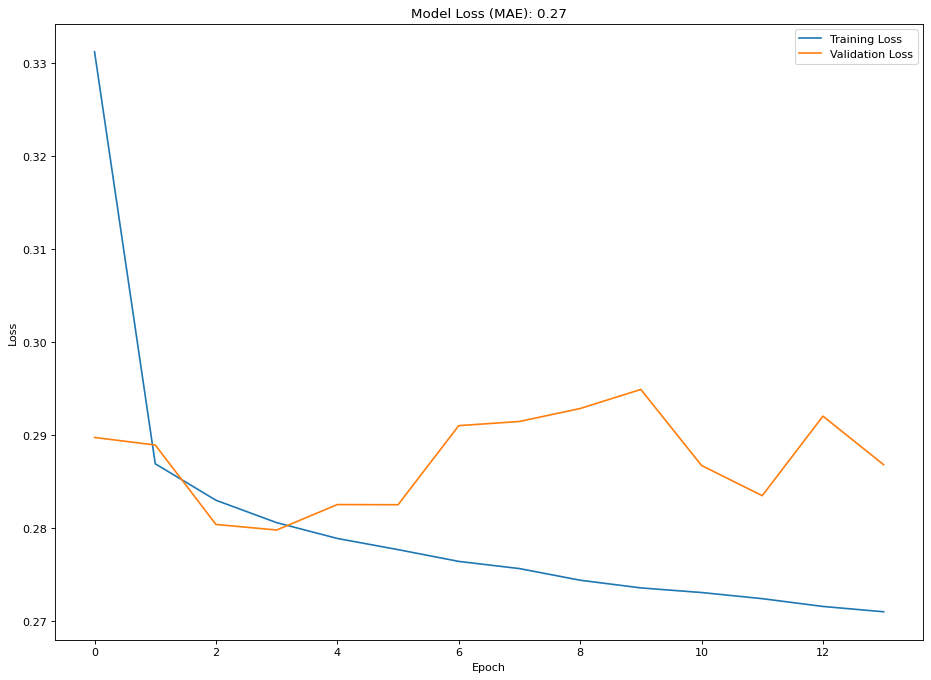

In [24]:
#Input and Outpus number
listsee = [0]
listall = [9]

model = get_model(x_train, y_train, x_test, y_test, listall, "FUTURE_AQI_v1")

## testing

In [25]:
import matplotlib.pyplot as plt

def plot_data_comp(title, data_plot1, data_plot2):
    # Create a figure with larger dimensions for visibility
    plt.figure(figsize=(300, 50), dpi=100, facecolor='w', edgecolor='k')

    # Plot the original data (e.g., AQI values from actual data)
    plt.plot(data_plot1, label="Original", alpha=0.6,linewidth=2)

    # Plot the predicted data (e.g., AQI values predicted by the model)
    plt.plot(data_plot2, label="Predicted", alpha=0.6, linewidth=2)

    # Set labels for x and y axes
    plt.xlabel("Time (e.g., Hours)", fontsize=14)
    plt.ylabel("AQI", fontsize=14)

    # Set title for the plot
    plt.title(title, fontsize=16)

    # Add a legend to the plot to distinguish between original and predicted
    plt.legend(loc='best', fontsize=12)

    # Display the plot
    plt.show()


In [26]:
values_title = list(X.columns.values)


predictions = model.predict(x_test)

# Plot comparison between true and predicted values
plot_data_comp(
    "Comparison %s: Anemometer vs. Predicted: Dataset = TEST" % values_title[-1], 
    y_test, 
    predictions
)

146/146 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


In [27]:
i=6
print(f"Actual data point: {y_test[i]} \nPredicted: {predictions[i]} ")

Actual data point: [-0.76529161 -0.76861571 -0.74528307] 
Predicted: [-0.791302   -0.78775114 -0.79012984] 


In [ ]:
import joblib

# Load the scalers
scaler_X = joblib.load('scaler_X_cpcb_4.pkl')
scaler_y = joblib.load('scaler_y_cpcb_4.pkl')

# Standardize the features
scaler_X = StandardScaler()
x_train = scaler_X.fit_transform(x_train)
x_test = scaler_X.transform(x_test)


predictions_actual = scaler_y.inverse_transform(predictions)
y_test_actual = scaler_y.inverse_transform(y_test)
prediction_df = pd.DataFrame(predictions_actual, columns=y.columns)

In [ ]:
# If you need the targets as a Pandas DataFrame:
prediction_df = pd.DataFrame(predictions_actual, columns=y.columns)
original_y_test_df = pd.DataFrame(y_test_actual, columns=y.columns)

In [ ]:
print(f"{original_y_test_df.head(10)} \n {prediction_df.head(10)} ")

   AQI_step_1  AQI_step_2  AQI_step_3
0        78.0        78.0        78.0
1       213.0       210.0       205.0
2        66.0        66.0        67.0
3       287.0       285.0       282.0
4       304.0       304.0       305.0
5        70.0        70.0        70.0
6       327.0       342.0       357.0
7        99.0        96.0        92.0
8        83.0        83.0        83.0
9        54.0        54.0        54.0 
    AQI_step_1  AQI_step_2  AQI_step_3
0   77.684845   77.591393   77.542526
1  217.384933  217.514862  217.400192
2   62.181751   62.132893   62.222591
3  288.356689  287.636810  287.763824
4  303.412048  302.495270  303.200928
5   70.733574   70.657349   70.660240
6  321.902374  321.668549  323.169891
7  103.093163  102.998848  102.905289
8   83.326515   83.239510   83.189705
9   54.360836   54.309277   54.430218 


## testing on the unknown data 


In [3]:
df = pd.read_excel(r"C:\Users\Admin\Documents\dev patel\GeoSpatial Recognition\Delhi_data_Test.xlsx")
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 90 entries, 0 to 89
Data columns (total 13 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   From Date  90 non-null     object 
 1   To Date    90 non-null     object 
 2   PM2.5      89 non-null     float64
 3   PM10       89 non-null     float64
 4   NO         90 non-null     float64
 5   NO2        90 non-null     float64
 6   NOx        90 non-null     float64
 7   NH3        90 non-null     float64
 8   SO2        90 non-null     float64
 9   CO         90 non-null     float64
 10  Ozone      88 non-null     float64
 11  Benzene    85 non-null     float64
 12  Toluene    85 non-null     float64
dtypes: float64(11), object(2)
memory usage: 9.3+ KB


In [4]:
# PM2.5	PM10	NO	NO2	NOx	NH3	CO	SO2	O3	Benzene	Toluene	Xylene	AQI	Day	Month	Hour	AQI_step_1	AQI_step_2	AQI_step_3
df.head(1)

,From Date,To Date,PM2.5,PM10,NO,NO2,NOx,NH3,SO2,CO,Ozone,Benzene,Toluene
0,19-11-2024 00:00,19-11-2024 01:00,526.0,650.0,50.17,82.67,84.67,64.0,10.17,3.15,30.6,0.0,0.0


In [5]:
df.columns

Index(['From Date', 'To Date', 'PM2.5', 'PM10', 'NO', 'NO2', 'NOx', 'NH3',
       'SO2', 'CO', 'Ozone', 'Benzene', 'Toluene'],
      dtype='object')

In [10]:
df = df[['To Date', 'PM2.5', 'PM10', 'NO', 'NO2', 'NOx', 'NH3', 
       'SO2', 'CO', 'Ozone', 'Benzene', 'Toluene', ]]
df['Xylene']=0.0
df=df.fillna(0.0)
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 90 entries, 0 to 89
Data columns (total 13 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   To Date  90 non-null     object 
 1   PM2.5    90 non-null     float64
 2   PM10     90 non-null     float64
 3   NO       90 non-null     float64
 4   NO2      90 non-null     float64
 5   NOx      90 non-null     float64
 6   NH3      90 non-null     float64
 7   SO2      90 non-null     float64
 8   CO       90 non-null     float64
 9   Ozone    90 non-null     float64
 10  Benzene  90 non-null     float64
 11  Toluene  90 non-null     float64
 12  Xylene   90 non-null     float64
dtypes: float64(12), object(1)
memory usage: 9.3+ KB


In [11]:
df['Date'] = pd.to_datetime(df['To Date'])
df['Day'] = pd.to_datetime(df['Date']).dt.day
df['Month'] = pd.to_datetime(df['Date']).dt.month
df['Hour'] = pd.to_datetime(df['Date']).dt.hour
df = df[['PM2.5', 'PM10', 'NO', 'NO2', 'NOx', 'NH3', 'SO2', 
         'CO', 'Ozone', 'Benzene', 'Toluene', 'Xylene', 'Day', 'Month', 
         'Hour']]
df.head(1)

C:\Users\Admin\AppData\Local\Temp\ipykernel_10812\4070172974.py:1: UserWarning: Parsing dates in %d-%m-%Y %H:%M format when dayfirst=False (the default) was specified. Pass `dayfirst=True` or specify a format to silence this warning.
  df['Date'] = pd.to_datetime(df['To Date'])


,PM2.5,PM10,NO,NO2,NOx,NH3,SO2,CO,Ozone,Benzene,Toluene,Xylene,Day,Month,Hour
0,526.0,650.0,50.17,82.67,84.67,64.0,10.17,3.15,30.6,0.0,0.0,0.0,19,11,1


In [12]:
df.columns

Index(['PM2.5', 'PM10', 'NO', 'NO2', 'NOx', 'NH3', 'SO2', 'CO', 'Ozone',
       'Benzene', 'Toluene', 'Xylene', 'Day', 'Month', 'Hour'],
      dtype='object')

In [13]:
# Define the sub-index calculation function based on CPCB guidelines
def calculate_sub_index(concentration, pollutant):
    if pollutant == "PM2.5":
        if concentration <= 30:
            return concentration * 50 / 30
        elif concentration <= 60:
            return 50 + (concentration - 30) * 50 / 30
        elif concentration <= 90:
            return 100 + (concentration - 60) * 100 / 30
        elif concentration <= 120:
            return 200 + (concentration - 90) * 100 / 30
        elif concentration <= 250:
            return 300 + (concentration - 120) * 100 / 130
        else:
            return 400 + (concentration - 250) * 100 / 130
    elif pollutant == "PM10":
        if concentration <= 50:
            return concentration
        elif concentration <= 100:
            return 50 + (concentration - 50)
        elif concentration <= 250:
            return 100 + (concentration - 100) * 100 / 150
        elif concentration <= 350:
            return 200 + (concentration - 250)
        elif concentration <= 430:
            return 300 + (concentration - 350) * 100 / 80
        else:
            return 400 + (concentration - 430) * 100 / 80
    elif pollutant == "SO2" or pollutant == "NO2":
        if concentration <= 40:
            return concentration * 50 / 40
        elif concentration <= 80:
            return 50 + (concentration - 40) * 50 / 40
        elif concentration <= 380:
            return 100 + (concentration - 80) * 100 / 300
        elif concentration <= 800:
            return 200 + (concentration - 380) * 100 / 420
        elif concentration <= 1600:
            return 300 + (concentration - 800) * 100 / 800
        else:
            return 400 + (concentration - 1600) * 100 / 800
    elif pollutant == "CO":
        if concentration <= 1:
            return concentration * 50 / 1
        elif concentration <= 2:
            return 50 + (concentration - 1) * 50 / 1
        elif concentration <= 10:
            return 100 + (concentration - 2) * 100 / 8
        elif concentration <= 17:
            return 200 + (concentration - 10) * 100 / 7
        elif concentration <= 34:
            return 300 + (concentration - 17) * 100 / 17
        else:
            return 400 + (concentration - 34) * 100 / 17
    elif pollutant == "Ozone":
        if concentration <= 50:
            return concentration
        elif concentration <= 100:
            return 50 + (concentration - 50)
        elif concentration <= 168:
            return 100 + (concentration - 100) * 100 / 68
        elif concentration <= 208:
            return 200 + (concentration - 168) * 100 / 40
        elif concentration <= 748:
            return 300 + (concentration - 208) * 100 / 540
        else:
            return 400 + (concentration - 748) * 100 / 540
    else:
        return 0

def calculate_aqi(row):
    sub_indices = {
        "PM2.5": calculate_sub_index(row["PM2.5"], "PM2.5"),
        "PM10": calculate_sub_index(row["PM10"], "PM10"),
        "SO2": calculate_sub_index(row["SO2"], "SO2"),
        "NO2": calculate_sub_index(row["NO2"], "NO2"),
        "CO": calculate_sub_index(row["CO"], "CO"),
        "Ozone": calculate_sub_index(row["Ozone"], "Ozone"),
    }
    valid_sub_indices = [sub_index for sub_index in sub_indices.values() if sub_index > 0]
    return max(valid_sub_indices, default=np.nan)

 # Calculate AQI
df["AQI"] = df.apply(calculate_aqi, axis=1)

In [14]:
df.columns

Index(['PM2.5', 'PM10', 'NO', 'NO2', 'NOx', 'NH3', 'SO2', 'CO', 'Ozone',
       'Benzene', 'Toluene', 'Xylene', 'Day', 'Month', 'Hour', 'AQI'],
      dtype='object')

In [15]:
df.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
PM2.5,90.0,274.033333,79.472481,0.0000,226.250000,278.500000,315.0000,526.00
PM10,90.0,445.266667,155.551848,0.0000,365.500000,411.000000,497.7500,986.00
NO,90.0,86.538889,113.214263,0.6000,6.812500,36.260000,109.2900,411.05
NO2,90.0,79.378556,28.575377,30.8300,60.875000,77.040000,91.9600,152.17
NOx,90.0,112.526111,105.185332,16.9300,39.655000,74.150000,137.3975,415.65
NH3,90.0,50.195889,9.046429,32.4500,42.827500,49.415000,57.5500,70.85
SO2,90.0,9.317556,2.946489,3.5000,7.417500,9.035000,10.8550,17.35
CO,90.0,2.369667,2.080378,0.0500,1.022500,1.525000,3.1300,9.33
Ozone,90.0,22.659111,22.553762,0.0000,15.642500,18.925000,22.9100,182.68
Benzene,90.0,0.016556,0.036355,0.0000,0.000000,0.000000,0.0000,0.12


! Lets Transform the time to represent the periodicity in a Sin/Cos seconds space

In [16]:
# Transformations for time-based features
day_hours = 24
month_days = 31
year_months = 12

# Transform 'Hour' to sin and cos
df['Hour sin'] = np.sin(2 * np.pi * df['Hour'] / day_hours)
df['Hour cos'] = np.cos(2 * np.pi * df['Hour'] / day_hours)

# Transform 'Day' to sin and cos
df['Day sin'] = np.sin(2 * np.pi * df['Day'] / month_days)
df['Day cos'] = np.cos(2 * np.pi * df['Day'] / month_days)

# Transform 'Month' to sin and cos
df['Month sin'] = np.sin(2 * np.pi * df['Month'] / year_months)
df['Month cos'] = np.cos(2 * np.pi * df['Month'] / year_months)

# Check for duplicate timeframes
#duplicates = df.duplicated(subset=['Location', 'Hour', 'Day', 'Month'], keep=False)
#print(f"Number of duplicate timeframes (across locations): {duplicates.sum()}")
df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 90 entries, 0 to 89
Data columns (total 22 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   PM2.5      90 non-null     float64
 1   PM10       90 non-null     float64
 2   NO         90 non-null     float64
 3   NO2        90 non-null     float64
 4   NOx        90 non-null     float64
 5   NH3        90 non-null     float64
 6   SO2        90 non-null     float64
 7   CO         90 non-null     float64
 8   Ozone      90 non-null     float64
 9   Benzene    90 non-null     float64
 10  Toluene    90 non-null     float64
 11  Xylene     90 non-null     float64
 12  Day        90 non-null     int32  
 13  Month      90 non-null     int32  
 14  Hour       90 non-null     int32  
 15  AQI        90 non-null     float64
 16  Hour sin   90 non-null     float64
 17  Hour cos   90 non-null     float64
 18  Day sin    90 non-null     float64
 19  Day cos    90 non-null     float64
 20  Month sin  9

In [17]:
pollutant_columns = ['PM2.5', 'PM10', 'NO', 'NO2', 'NOx', 'NH3', 'SO2', 'CO', 'Ozone', 'Benzene', 'Toluene', 'Xylene']
df[pollutant_columns] = df[pollutant_columns].fillna(0)

In [18]:
dx= df.dropna()
dx.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 90 entries, 0 to 89
Data columns (total 22 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   PM2.5      90 non-null     float64
 1   PM10       90 non-null     float64
 2   NO         90 non-null     float64
 3   NO2        90 non-null     float64
 4   NOx        90 non-null     float64
 5   NH3        90 non-null     float64
 6   SO2        90 non-null     float64
 7   CO         90 non-null     float64
 8   Ozone      90 non-null     float64
 9   Benzene    90 non-null     float64
 10  Toluene    90 non-null     float64
 11  Xylene     90 non-null     float64
 12  Day        90 non-null     int32  
 13  Month      90 non-null     int32  
 14  Hour       90 non-null     int32  
 15  AQI        90 non-null     float64
 16  Hour sin   90 non-null     float64
 17  Hour cos   90 non-null     float64
 18  Day sin    90 non-null     float64
 19  Day cos    90 non-null     float64
 20  Month sin  9

In [19]:
dx = dx[['PM2.5', 'PM10', 'NO', 'NO2', 'NOx', 'NH3', 'SO2', 'CO',
       'Ozone', 'Benzene', 'Toluene', 'Xylene', 'Day', 'Month', 'Hour',
       'Hour sin', 'Hour cos', 'Day sin', 'Day cos', 'Month sin',
       'Month cos','AQI',]]

In [21]:
def load_model(name):
    # Load JSON and create model
    json_file = open("%s.json" % name, "r")
    loaded_model_json = json_file.read()
    json_file.close()
    loaded_model = model_from_json(loaded_model_json)

    # Check if the weights file exists before loading
    weights_file = f"{name}.weights.h5"
    if not Path(weights_file).is_file():
        raise FileNotFoundError(f"Weight file {weights_file} not found.")
    
    # Load weights into the new model
    loaded_model.load_weights(weights_file)
    print("Loaded model from disk")
    return loaded_model

model = load_model('FUTURE_AQI_v1')

Loaded model from disk


In [23]:
import joblib

# Load the scalers
scaler_X = joblib.load('scaler_X_cpcb_4.pkl')
scaler_y = joblib.load('scaler_y_cpcb_4.pkl')

# Standardize the features
x_test = scaler_X.transform(dx)

predictions = model.predict(x_test)
predictions_actual = scaler_y.inverse_transform(predictions)
prediction_df = pd.DataFrame(predictions_actual, columns=['D1','D2','D3'])
res = pd.concat([dx,prediction_df],axis=1)
res

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step 


,PM2.5,PM10,NO,NO2,NOx,NH3,SO2,CO,Ozone,Benzene,...,Hour sin,Hour cos,Day sin,Day cos,Month sin,Month cos,AQI,D1,D2,D3
0,526.0,650.0,50.17,82.67,84.67,64.00,10.17,3.15,30.60,0.0,...,0.258819,0.965926,-0.651372,-0.758758,-0.5,0.866025,675.000000,489.160431,460.272644,447.446106
1,512.0,600.0,14.58,75.92,52.17,59.60,8.15,2.14,26.10,0.0,...,0.500000,0.866025,-0.651372,-0.758758,-0.5,0.866025,612.500000,464.328339,441.583038,431.263702
2,432.0,519.0,23.30,75.20,58.90,61.10,8.10,2.03,25.80,0.0,...,0.707107,0.707107,-0.651372,-0.758758,-0.5,0.866025,540.000000,445.373779,428.962677,421.345062
3,395.0,462.0,6.25,65.55,39.97,66.42,7.05,1.81,24.30,0.0,...,0.866025,0.500000,-0.651372,-0.758758,-0.5,0.866025,511.538462,429.308899,417.612000,411.960297
4,373.0,433.0,5.35,54.15,33.12,62.83,7.20,1.52,23.80,0.0,...,0.965926,0.258819,-0.651372,-0.758758,-0.5,0.866025,494.615385,423.034302,414.902618,410.844543
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
85,261.0,365.0,2.42,42.83,24.70,65.22,11.47,0.79,182.68,0.0,...,-0.500000,-0.866025,-0.968077,-0.250653,-0.5,0.866025,408.461538,357.532959,344.282990,337.642944
86,239.0,355.0,3.12,43.18,25.50,63.83,10.88,0.62,0.00,0.0,...,-0.707107,-0.707107,-0.968077,-0.250653,-0.5,0.866025,391.538462,352.859833,354.164703,353.753265
87,223.0,344.0,1.20,30.83,16.93,48.48,10.15,0.32,0.00,0.0,...,-0.866025,-0.500000,-0.968077,-0.250653,-0.5,0.866025,379.230769,313.730774,309.885651,306.891602
88,219.0,309.0,27.10,73.67,61.35,57.60,9.27,3.29,108.90,0.0,...,-0.965926,-0.258819,-0.968077,-0.250653,-0.5,0.866025,376.153846,253.830185,227.173218,214.359665


In [ ]:
new =res[['Day', 'Month', 'Hour','AQI', 'D1','D2', 'D3']]
new = new[new['Hour']==3]
new 

,Day,Month,Hour,AQI,D1,D2,D3
2,19,11,3,540.000000,445.373779,428.962677,421.345062
26,20,11,3,496.923077,428.263153,416.913879,411.400238
50,21,11,3,411.538462,395.774536,385.396454,379.943573
74,22,11,3,433.076923,428.416595,413.518616,406.497345


In [ ]:
new[['Day', 'Month', 'Hour','AQI', 'D1','D2', 'D3']]


,Day,Month,Hour,AQI,D1,D2,D3
0,19,11,1,675.000000,489.160431,460.272644,447.446106
24,20,11,1,476.923077,431.099823,417.600586,411.151642
48,21,11,1,543.750000,426.673126,389.989197,372.881165
72,22,11,1,486.250000,445.374908,428.059326,420.073059
